In [1]:
# prototype

In [1]:
import os
from os.path import join
import random
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from skimage import measure
from torch.utils.data import Dataset, DataLoader
import torchio as tio
from torchio.data import SubjectsLoader

from monai.networks.nets import UNet

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import torch
import torch.nn as nn

seed = 42
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(seed)

In [2]:
import sys
print('__Python VERSION:', sys.version)
print('__pyTorch VERSION:', torch.__version__)
print('__CUDA VERSION')
from subprocess import call
! nvcc --version
print('__CUDNN VERSION:', torch.backends.cudnn.version())
print('__Number CUDA Devices:', torch.cuda.device_count())
print('__Devices')
call(["nvidia-smi", "--format=csv", "--query-gpu=index,name,driver_version,memory.total,memory.used,memory.free"])
print('Active CUDA Device: GPU', torch.cuda.current_device())
print ('Available devices ', torch.cuda.device_count())
print ('Current cuda device ', torch.cuda.current_device())
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

__Python VERSION: 3.9.21 (main, Dec 11 2024, 16:35:24) [MSC v.1929 64 bit (AMD64)]
__pyTorch VERSION: 2.8.0.dev20250416+cu128
__CUDA VERSION
nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2025 NVIDIA Corporation
Built on Fri_Feb_21_20:42:46_Pacific_Standard_Time_2025
Cuda compilation tools, release 12.8, V12.8.93
Build cuda_12.8.r12.8/compiler.35583870_0
__CUDNN VERSION: 90701
__Number CUDA Devices: 1
__Devices
Active CUDA Device: GPU 0
Available devices  1
Current cuda device  0


In [3]:
from utils.loading_utils import *
from visualization.visualization import *
from ml.dataset_ import BrainMetDatasetPreloaded, GridSamplerWrapper
from ml.trainer import Trainer

In [4]:
#root_dir = './MICCAI-LH-BraTS2025-MET-Challenge-Training/'
root_dir = './training_helper/'
case_contents = inspect_case_contents(root_dir)
# filter sus stuff
filtered_contents = filter_suspicious_cases(root_dir, case_contents)

train_transform_patch = tio.Compose([
    tio.ZNormalization(include=('t1n', 't1c', 't2w', 't2f')),
    tio.Resample((1, 1, 1)),
    tio.EnsureShapeMultiple(16),
    tio.RandomAffine(scales=(0.9, 1.1), degrees=10),
    tio.RandomElasticDeformation(),
    #tio.RandomNoise(),
    #tio.RandomFlip(axes=('LR',)),
])

# this takes some time
train_dataset = BrainMetDatasetPreloaded(
    root_dir=root_dir,
    case_contents=filtered_contents,
    with_segmentation=True,
    transforms=train_transform_patch,
    to_device='cuda'
)
subjects_dataset = tio.SubjectsDataset(train_dataset)

Total cases: 5
Excluded 0 cases with suspicious orientation.
Skipped 0 cases without T1c.
Preloading dataset into memory...


Loading cases: 100%|██████████| 5/5 [01:27<00:00, 17.42s/it]


In [5]:
sampler = GridSamplerWrapper(patch_size=(128, 128, 128), patch_overlap=(32, 32, 32))

patches_queue = tio.Queue(
    subjects_dataset=subjects_dataset,
    max_length=500,
    samples_per_volume=100,
    sampler=sampler,
    num_workers=0,
    shuffle_subjects=True,
    shuffle_patches=True,
)

train_loader = SubjectsLoader(
    patches_queue,
    batch_size=16,
    num_workers=0,  # on windows; seems to only work like this!
    #num_workers=4,
)

# next cells were just to tell if it works or no... skip

In [7]:
# now only copy paste stuff to see whether this works

import torch
import torch.nn as nn
from monai.networks.nets import UNet

model = UNet(
    spatial_dims=3,       
    in_channels=4,
    out_channels=5,
    channels=(32, 64, 128, 256, 512),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)



2025-05-03 13:08:28.931272: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-03 13:08:28.931366: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-03 13:08:28.932363: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-03 13:08:28.939460: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-03 13:08:29.915992: W tensorflow/compiler/tf2

In [12]:
# gpt

def dice_loss(pred, target, epsilon=1e-5):
    # Assumes pred is softmax, target is one-hot
    intersection = (pred * target).sum(dim=(2, 3, 4))
    union = pred.sum(dim=(2, 3, 4)) + target.sum(dim=(2, 3, 4))
    dice = 2. * intersection / (union + epsilon)
    return 1 - dice.mean()

ce_loss = nn.CrossEntropyLoss()

def loss_fn(logits, target):
    ce = ce_loss(logits, target.to(torch.long))  # only target needs to be long
    probs = torch.softmax(logits, dim=1)
    one_hot_target = torch.nn.functional.one_hot(target.to(torch.long), num_classes=logits.shape[1]).permute(0, 4, 1, 2, 3).float()
    dice = dice_loss(probs, one_hot_target)
    return ce + dice


Step 1 | Loss: 1.8344


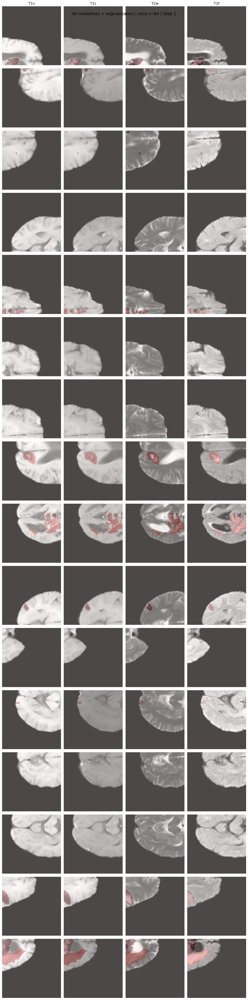

Step 2 | Loss: 1.8277


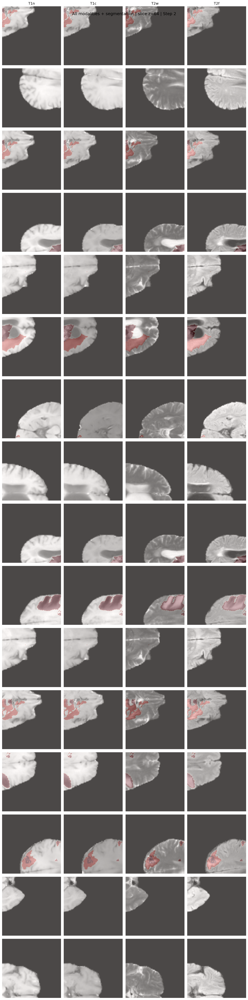

Step 3 | Loss: 1.8111


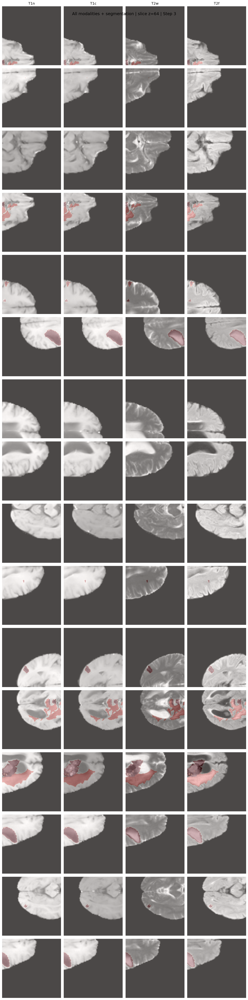

Step 4 | Loss: 1.8075


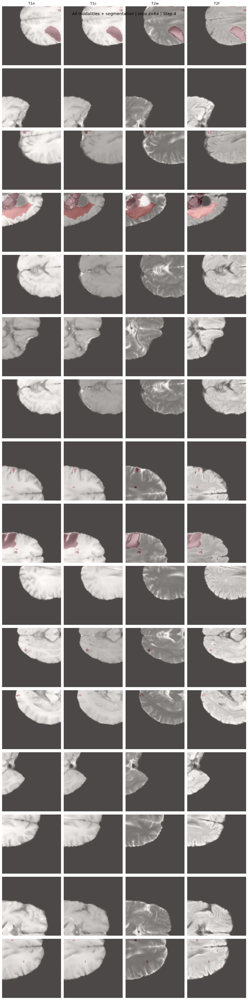

Step 5 | Loss: 1.8149


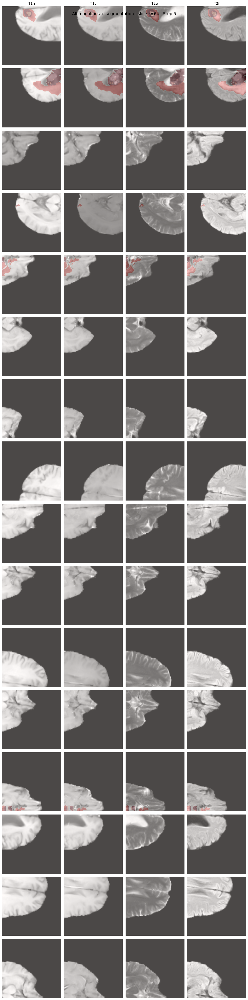

Step 6 | Loss: 1.8163


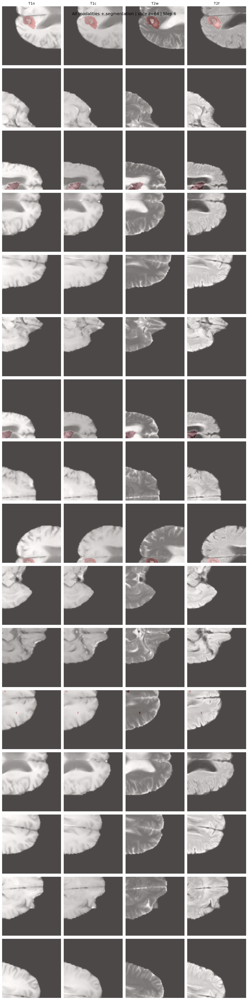

In [17]:

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

for i, batch in enumerate(train_loader):
    inputs = torch.cat([
        batch['t1n'][tio.DATA],
        batch['t1c'][tio.DATA],
        batch['t2w'][tio.DATA],
        batch['t2f'][tio.DATA],
    ], dim=1).to(device)

    targets = batch['seg'][tio.DATA].squeeze(1).to(device)
    logits = model(inputs)
    loss = loss_fn(logits, targets)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    print(f"Step {i + 1} | Loss: {loss.item():.4f}")

    # --- Plot all modalities with target overlay ---
    modalities = ['t1n', 't1c', 't2w', 't2f']
    mod_titles = ['T1n', 'T1c', 'T2w', 'T2f']
    batch_size = targets.shape[0]
    z = targets.shape[-1] // 2  # axial slice index

    fig, axes = plt.subplots(batch_size, len(modalities), figsize=(len(modalities) * 3, batch_size * 3))

    for bi in range(batch_size):
        for mi, mod in enumerate(modalities):
            image_tensor = batch[mod][tio.DATA][bi, 0].cpu().numpy()
            seg_tensor = targets[bi].cpu().numpy()
            img_slice = image_tensor[:, :, z]
            seg_slice = seg_tensor[:, :, z]

            ax = axes[bi, mi] if batch_size > 1 else axes[mi]
            ax.imshow(img_slice, cmap='gray')
            ax.imshow(seg_slice, cmap='Reds', alpha=0.3)
            if bi == 0:
                ax.set_title(mod_titles[mi])
            ax.axis('off')

    plt.suptitle(f"All modalities + segmentation | slice z={z} | Step {i + 1}", fontsize=14)
    plt.tight_layout()
    plt.show()
    # -----------------------------------------------

    if i == 5:
        break
        
    
# just plotting this to check if its working
# seems like it is

# every iteration - 16 rows = batch size
#                 - 4 cols = modalities

# model should be checked

# Serious stuff

In [6]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = UNet(
    spatial_dims=3,
    in_channels=4,
    out_channels=5,
    channels=(32, 64, 128, 256, 512),
    strides=(2, 2, 2, 2),
    num_res_units=2,
).to(device)


def dice_loss(pred, target, epsilon=1e-5):
    intersection = (pred * target).sum(dim=(2, 3, 4))
    union = pred.sum(dim=(2, 3, 4)) + target.sum(dim=(2, 3, 4))
    dice = 2. * intersection / (union + epsilon)
    return 1 - dice.mean()

ce_loss = nn.CrossEntropyLoss()

def loss_fn(logits, target):
    ce = ce_loss(logits, target.to(torch.long))
    probs = torch.softmax(logits, dim=1)
    one_hot_target = torch.nn.functional.one_hot(target.to(torch.long), num_classes=logits.shape[1]).permute(0, 4, 1, 2, 3).float()
    dice = dice_loss(probs, one_hot_target)
    return ce + dice

def dice_score(pred, target, epsilon=1e-5):
    """Computes average Dice score per batch"""

    # this is a voxel-wise implementation of dice score... however challenge ranks lesion wise
    probs = torch.softmax(pred, dim=1)                   # (B, C, H, W, D)
    preds = torch.argmax(probs, dim=1)                   # (B, H, W, D)
    targets = target.long()                              # (B, H, W, D)

    dice_scores = []
    num_classes = pred.shape[1]

    for c in range(1, num_classes):  # skip background class 0
        pred_c = (preds == c).float()
        target_c = (targets == c).float()

        intersection = (pred_c * target_c).sum(dim=(1,2,3))  # sum over HWD
        union = pred_c.sum(dim=(1,2,3)) + target_c.sum(dim=(1,2,3))

        dice = (2 * intersection + epsilon) / (union + epsilon)
        dice_scores.append(dice)

    mean_dice = torch.stack(dice_scores).mean()  # average over all foreground classes
    return mean_dice

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

In [7]:
trainer = Trainer(model, optimizer, loss_fn, dice_score, device=device)
trainer.train(train_loader, val_loader=train_loader, epochs=5)

Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 512.00 MiB. GPU 0 has a total capacity of 6.00 GiB of which 0 bytes is free. Of the allocated memory 11.65 GiB is allocated by PyTorch, and 844.66 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

Original shape: (256, 256, 126)
Original spacing: (0.8984, 0.8984, 1.5)
Original spacing: <class 'tuple'>
Resampled shape: (230, 230, 189)
Resampled shape: <class 'numpy.ndarray'>


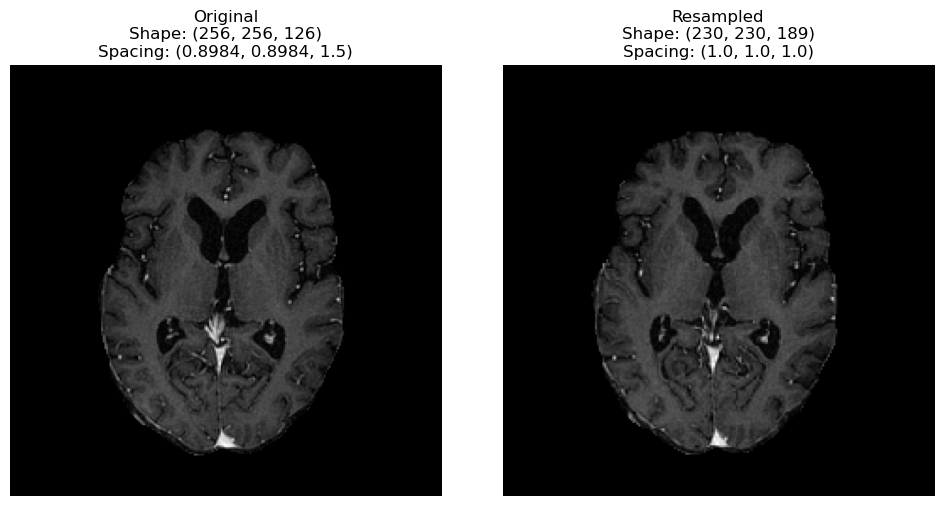

In [18]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def resample_nearest_numpy(volume, input_spacing, target_spacing=(1.0, 1.0, 1.0)):
    input_spacing = np.array(input_spacing)
    target_spacing = np.array(target_spacing)
    zoom_factors = input_spacing / target_spacing

    input_shape = np.array(volume.shape)
    output_shape = np.round(input_shape * zoom_factors).astype(int)

    # Create output grid
    dz = np.linspace(0, input_shape[0] - 1, output_shape[0]).astype(int)
    dy = np.linspace(0, input_shape[1] - 1, output_shape[1]).astype(int)
    dx = np.linspace(0, input_shape[2] - 1, output_shape[2]).astype(int)

    # Meshgrid for indexing
    zz, yy, xx = np.meshgrid(dz, dy, dx, indexing='ij')

    return volume[zz, yy, xx]

# Example usage:

tmp= 'BraTS-MET-00758-000'
path = f"./MICCAI-LH-BraTS2025-MET-Challenge-Training/{tmp}/{tmp}-t1c.nii.gz"

img = nib.load(path)
data = img.get_fdata(dtype=np.float32)
spacing = img.header.get_zooms()[:3]

#print(data.shape)
#print(spacing)

# Resample to (1.0, 1.0, 1.0)
resampled  = resample_nearest_numpy(data, spacing, target_spacing=(1.0, 1.0, 1.0))

print("Original shape:", data.shape)
print("Original spacing:", spacing)
print("Original spacing:", type(spacing))
print("Resampled shape:", resampled.shape)
print("Resampled shape:", type(resampled))

# === Visualize center slice ===
z_orig = data.shape[2] // 2
z_resampled = resampled.shape[2] // 2

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(data[:, :, z_orig].T, cmap="gray", origin="lower")
plt.title(f"Original\nShape: {data.shape}\nSpacing: {spacing}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(resampled[:, :, z_resampled].T, cmap="gray", origin="lower")
plt.title(f"Resampled\nShape: {resampled.shape}\nSpacing: (1.0, 1.0, 1.0)")
plt.axis("off")

plt.tight_layout()
plt.show()